In [12]:
import numpy as np
import pandas as pd
import requests
from datetime import date


In [19]:
# Paths
DATAPATH = "/Users/denizthemenace/dev/artcollect/data/"

# Load un-pre-processed lots into dataframe
lots = pd.read_json(DATAPATH + 'lots_not_preprocessed.json')
print('Loaded', len(lots), 'lots in USD for pre-processing')

Loaded 78718 lots in USD for pre-processing


In [20]:
lots.describe()

,created_year,exhibited_in_museums,height,max_estimated_price,min_estimated_price,price,provenance_estate_of,width
count,78718.000000,22796.000000,70770.000000,7.871800e+04,7.871800e+04,7.871800e+04,56857.000000,70770.000000
mean,1950.835768,0.343350,121.526595,2.617203e+05,2.106518e+05,3.318748e+05,0.038623,82.185701
std,59.424279,0.723303,4353.527721,1.419211e+06,1.145361e+06,1.732224e+06,0.192697,74.770066
min,1500.000000,0.000000,0.033500,0.000000e+00,3.343945e+01,0.000000e+00,0.000000,0.200000
25%,1926.000000,0.000000,40.000000,1.000000e+04,8.000000e+03,1.337578e+04,0.000000,40.000000
50%,1963.000000,0.000000,63.182500,3.000000e+04,2.407640e+04,4.161119e+04,0.000000,64.135000
75%,1993.000000,1.000000,102.000000,1.000000e+05,8.000000e+04,1.433985e+05,0.000000,101.600000
max,2017.000000,11.000000,504270.010000,7.000000e+07,7.000000e+07,1.041680e+08,1.000000,10155.500000


In [21]:
%matplotlib inline

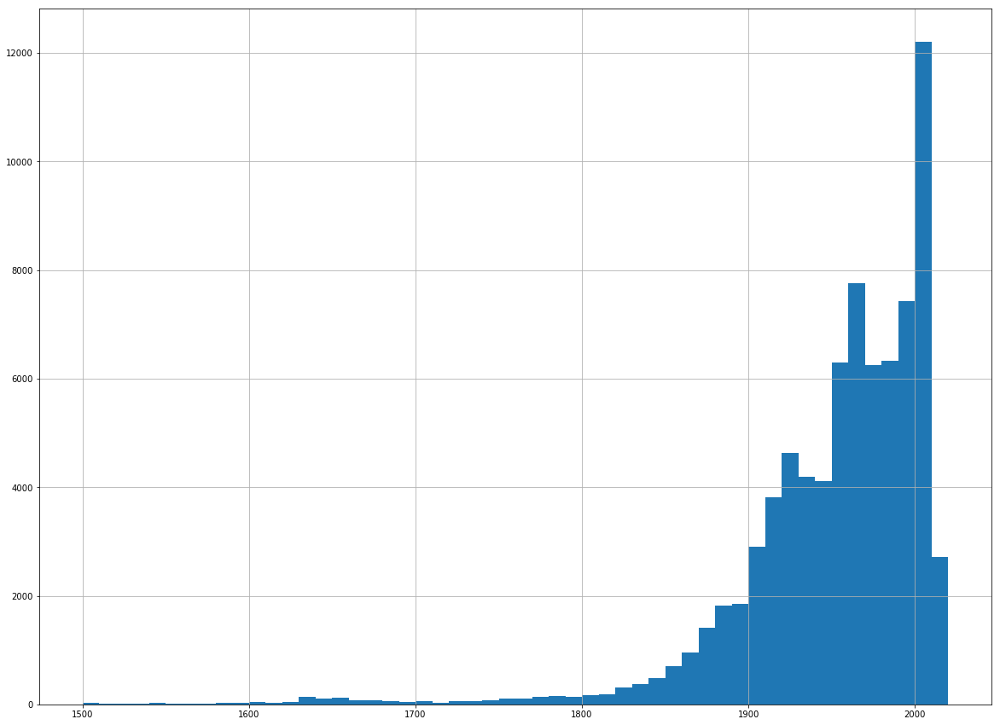

In [22]:
import matplotlib.pyplot as plt
lots['created_year'].hist(bins=52, figsize=(20,15), range=[1500, 2020])
plt.show()

In [26]:
import math
def number_of_digits(price):
    try:
        return math.floor(math.log(price,10)) +1
    except:
        return None

In [27]:
lots['digits']=lots['price'].apply(number_of_digits)

In [33]:
lots['digits'].value_counts().sort_index()

2.0       14
3.0      625
4.0    14097
5.0    39470
6.0    20041
7.0     4082
8.0      343
9.0        1
Name: digits, dtype: int64

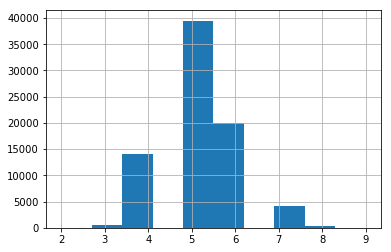

In [30]:
lots['digits'].hist()
plt.show()

In [131]:
number_of_digits(12333.4)

5

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1d220c400>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x1c4d47cc0>]], dtype=object)

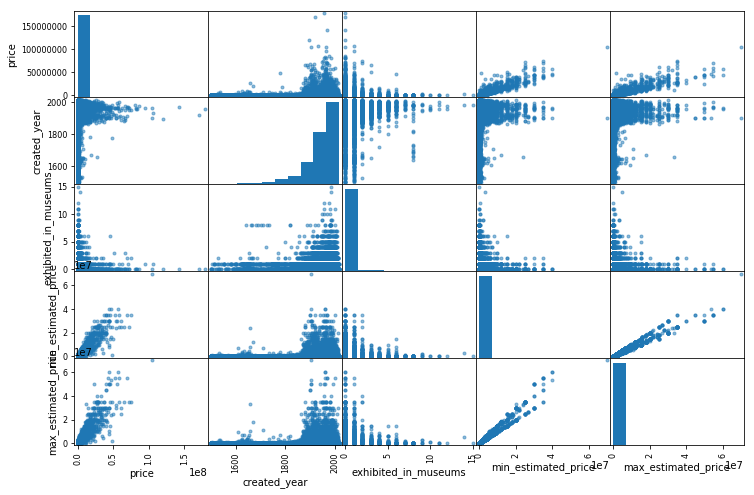

In [158]:
from pandas.tools.plotting import scatter_matrix
attributes = ['price', 'created_year', 'exhibited_in_museums', 'min_estimated_price', 'max_estimated_price' ]
scatter_matrix(lots_usd[attributes], figsize=(12,8))

In [181]:
lots_usd[['style', 'description' ]].to_csv(datapath+'style_description.csv', sep='\t')

In [195]:
with pd.option_context('display.max_rows', None, 'display.max_columns', 3):
    print(lots_usd['description'])

4                                                                                      T. Henwood, circa 1850
107       An Album and a small Quantity of unframed Drawings and Watercolours by or attributed to George H...
112                                                                                English School, circa 1800
116                                                                                English School, circa 1820
122                                                                          Anglo-Chinese School, circa 1800
134                                                                          Anglo-Chinese School, circa 1810
157       An Album of Waterclours, Drawings and Prints by or after to John Christian Schetky (1778-1874) a...
159       An Album of Drawings and Watercolours by or after Joshua Cristall (1767-1847), H.S Chive and oth...
163                                                                                     C.S Smith, circa 1820
173       

In [192]:
pd.options.display.max_colwidth = 100

In [194]:
pd.options.display.max_colwidth

100

In [38]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

documents = []
for i in range(0,10000):
    documents.append(lots.iloc[i]['description'])
    
'''documents = ["This little kitty came to play when I was eating at a restaurant.",
             "Merley has the best squooshy kitten belly.",
             "Google Translate app is incredible.",
             "If you open 100 tab in google you get a smiley face.",
             "Best cat photo I've ever taken.",
             "Climbing ninja cat.",
             "Impressed with google map feedback.",
             "Key promoter extension for Google Chrome."]
 
 '''
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(documents)
 
true_k = 11
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
model.fit(X)
 
print("Top terms per cluster:")
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()
for i in range(true_k):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :5]:
        print(' %s' % terms[ind]),
    print
 
 
print("\n")
print("Prediction")
 
Y = vectorizer.transform(["chrome browser to open."])
prediction = model.predict(Y)
print(prediction)
 
Y = vectorizer.transform(["My cat is hungry."])
prediction = model.predict(Y)
print(prediction)
 

Top terms per cluster:
Cluster 0:
 reverse
 canvas
 painted
 dated
 signed
Cluster 1:
 paper
 executed
 gouache
 lower
 ink
Cluster 2:
 born
 chinese
 painted
 pinyin
 cm
Cluster 3:
 work
 edition
 number
 print
 executed
Cluster 4:
 executed
 printed
 paper
 silver
 numbered
Cluster 5:
 100
 39½
 vasarely
 signed
 canvas
Cluster 6:
 francis
 sam
 souza
 1994
 1923
Cluster 7:
 oil
 canvas
 signed
 lower
 cm
Cluster 8:
 wou
 zao
 ki
 chu
 teh
Cluster 9:
 dufy
 raoul
 jean
 1877
 1953
Cluster 10:
 canvas
 oil
 painted
 la
 lower


Prediction
[7]
[7]


In [ ]:
documents[1000]

In [37]:
lots_usd['auction_house_name'].value_counts()

NameError: name 'lots_usd' is not defined